<a href="https://colab.research.google.com/github/julie-nguyen180/Telecom-Marketing-Campaign-Analysis/blob/main/Telecom_Marketing_Campaigns_Analysis_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Importing

## Import Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Statistical Thinking/Assessment 3/TeleCom_Data-2.csv', sep=';')

In [ ]:
# Split columns
df = df['age;"job";"marital";"education";"default";"housing";"loan";"contact";"month";"day_of_week";"duration";"campaign";"pdays";"previous";"poutcome";"emp.var.rate";"cons.price.idx";"cons.conf.idx";"euribor3m";"nr.employed";"y"'].str.split(';', expand=True)
df = df.apply(lambda x: x.str.replace('"', ''))

In [ ]:
df.columns = ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']

## General Information

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41180 entries, 0 to 41179
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             41180 non-null  object
 1   job             41180 non-null  object
 2   marital         41180 non-null  object
 3   education       41180 non-null  object
 4   default         41180 non-null  object
 5   housing         41180 non-null  object
 6   loan            41180 non-null  object
 7   contact         41180 non-null  object
 8   month           41180 non-null  object
 9   day_of_week     41180 non-null  object
 10  duration        41180 non-null  object
 11  campaign        41180 non-null  object
 12  pdays           41180 non-null  object
 13  previous        41180 non-null  object
 14  poutcome        41180 non-null  object
 15  emp.var.rate    41180 non-null  object
 16  cons.price.idx  41180 non-null  object
 17  cons.conf.idx   41180 non-null  object
 18  euribo

In [ ]:
#Change data type for numberic variables
df['age'] = pd.to_numeric(df['age'], errors='coerce')
df['duration'] = pd.to_numeric(df['duration'], errors='coerce')
df['campaign'] = pd.to_numeric(df['campaign'], errors='coerce')
df['pdays'] = pd.to_numeric(df['pdays'], errors='coerce')
df['previous'] = pd.to_numeric(df['previous'], errors='coerce')
df['emp.var.rate'] = pd.to_numeric(df['emp.var.rate'], errors='coerce')
df['cons.price.idx'] = pd.to_numeric(df['cons.price.idx'], errors='coerce')
df['cons.conf.idx'] = pd.to_numeric(df['cons.conf.idx'], errors='coerce')
df['euribor3m'] = pd.to_numeric(df['euribor3m'], errors='coerce')
df['nr.employed'] = pd.to_numeric(df['nr.employed'], errors='coerce')

#Change data type for cate 'y' to numberic
df['subscription'] = df['y'].map({'yes': 1, 'no': 0})
df['subscription'] = pd.to_numeric(df['subscription'], errors='coerce')
df.drop(columns=['y'], inplace=True)

#Convert 999 values in pdays to -1
df['pdays'].replace(999, -1, inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41180 entries, 0 to 41179
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41180 non-null  int64  
 1   job             41180 non-null  object 
 2   marital         41180 non-null  object 
 3   education       41180 non-null  object 
 4   default         41180 non-null  object 
 5   housing         41180 non-null  object 
 6   loan            41180 non-null  object 
 7   contact         41180 non-null  object 
 8   month           41180 non-null  object 
 9   day_of_week     41180 non-null  object 
 10  duration        41180 non-null  int64  
 11  campaign        41180 non-null  int64  
 12  pdays           41180 non-null  int64  
 13  previous        41180 non-null  int64  
 14  poutcome        41180 non-null  object 
 15  emp.var.rate    41180 non-null  float64
 16  cons.price.idx  41180 non-null  float64
 17  cons.conf.idx   41180 non-null 

In [ ]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscription
0,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,-1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,-1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,1,-1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
3,59,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1,-1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
4,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,1,-1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [ ]:
df.tail()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscription
41175,29,unemployed,single,basic.4y,no,yes,no,cellular,nov,fri,...,1,9,1,success,-1.1,94.767,-50.8,1.028,4963.6,0
41176,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,-1,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1
41177,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,-1,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41178,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,-1,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41179,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,-1,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1


## Attributes Dictionary
**Output target**
* y: Did the client subscribe to a Telecom plan?


**Customer information**
* age: Age
* job: Type of job
* marital: Marital status
* education: Level of education
* default: Has credit in default
* housing: Has a housing loan
* loan: Has a personal loan

**Current campaign related data**
* contact: Contact communication type
* day: Day of contact
* month: Month of contact
* duration: Last contact duration, in seconds (numeric)
* campaign: Number of contacts performed during this campaign and for this client

**Previous interaction performance**
* pdays: number of days that passed by after the client was last contacted from a previous campaign(numeric; 999 means client was not previously contacted)
* previous: number of contacts performed before this campaign and for this client (numeric)
* poutcome: outcome of the previous marketing campaign (categorical)

**Social and economic context attributes**
* emp.var.rate: employment variation rate - quarterly indicator (numeric)
* cons.price.idx: consumer price index - monthly indicator (numeric)    
* cons.conf.idx: consumer confidence index - monthly indicator (numeric)
* euribor3m: euribor 3 month rate - daily indicator (numeric)
* nr.employed: number employed - quarterly indicator (numeric)

---
***Important note***:  'duration' highly affects the output target (e.g., if 'duration'=0 then 'y'="no"). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. --> This should be use as a benchmark but excluded from the predictive models.

---


# Data Exploration

## Target Variable

In [ ]:
!pip install dataprep
import dataprep
from dataprep.eda import plot


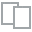
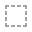
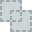
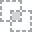
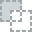
...
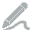
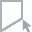
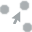
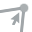
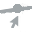

In [ ]:
plot(df, 'subscription')

**Subscription**: We see a large imbalance in the target variable ***(11% yes - 89% no)***, which requires special treatments to ensure accurate forecasting models and avoid bias towards the majority label:

* Split train/val/test with the same proportion
* Assess models based on AUC & F1-score
* Under sampling 80-20 and 70-30 to find the best models



## Numeric Variables

In [ ]:
# Store numeric variables into one group
numeric_vars = df.select_dtypes(include=['number']).columns
numeric_vars = numeric_vars.drop('subscription')

# Display the numeric variables
print(numeric_vars)

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')


In [ ]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscription
count,41180.000000,41180.000000,41180.000000,41180.000000,41180.000000,41180.000000,41180.000000,41180.000000,41180.000000,41180.000000,41180.000000
mean,40.021710,258.280427,2.567800,-0.742156,0.172705,0.081901,93.575508,-40.501999,3.621422,5167.053344,0.112627
std,10.419593,259.299856,2.770225,1.510080,0.493719,1.571037,0.578762,4.627358,1.734385,72.230334,0.316141
min,17.000000,0.000000,1.000000,-1.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000,0.000000
25%,32.000000,102.000000,1.000000,-1.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000,0.000000
50%,38.000000,180.000000,2.000000,-1.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000,0.000000
75%,47.000000,319.000000,3.000000,-1.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000,0.000000
max,98.000000,4918.000000,56.000000,27.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000,1.000000


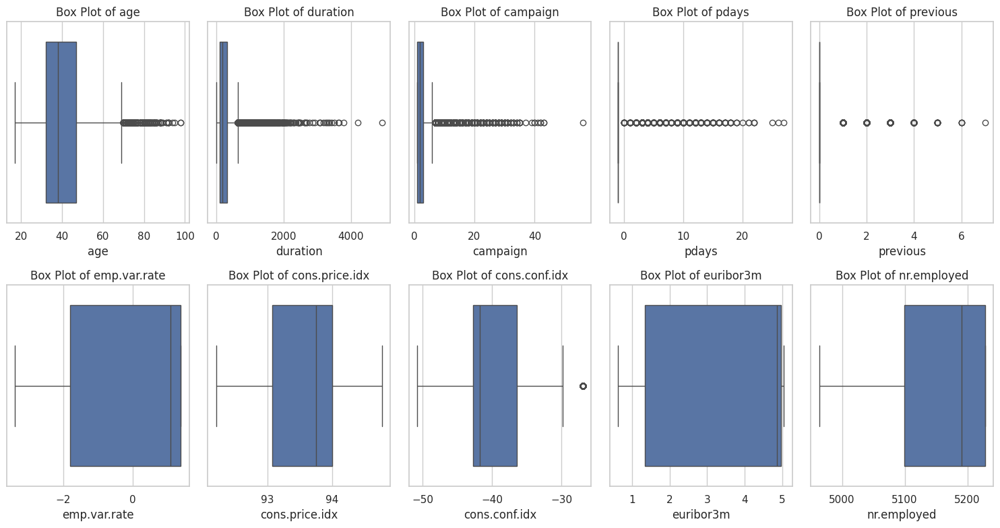

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of the visualization
sns.set(style='whitegrid')

# Determine the number of rows and columns for the grid
num_vars = len(numeric_vars)
cols = 5  # Number of columns per row
rows = (num_vars + cols - 1) // cols  # Calculate the number of rows

# Create box plots in a grid
plt.figure(figsize=(15, rows * 4))
for i, var in enumerate(numeric_vars):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(x=df[var])
    plt.title(f'Box Plot of {var}')
    plt.xlabel(var)
plt.tight_layout()
plt.show()

We found significant outliers in **'age', 'duration', 'campaign'**. IQR method will be applied to clean those outliers.

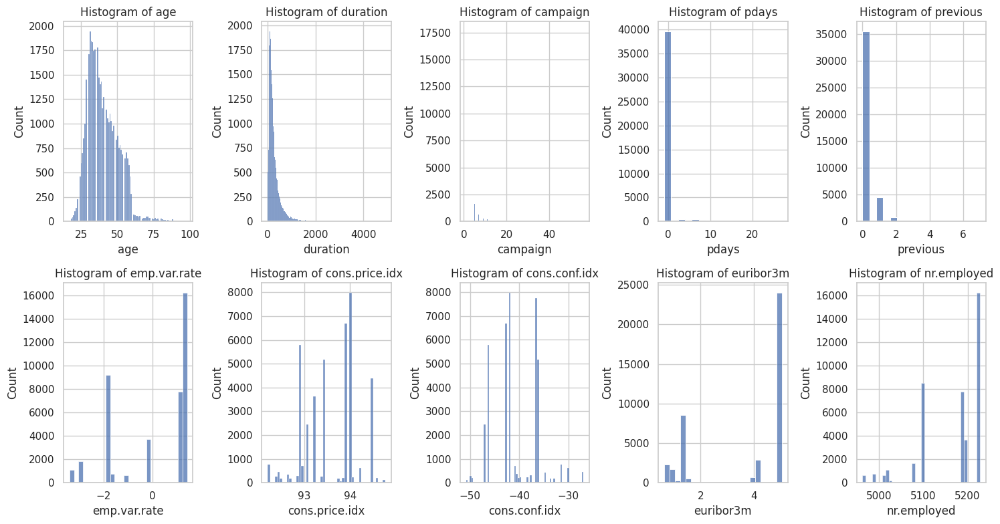

In [ ]:
# Create histograms in a grid
plt.figure(figsize=(15, rows * 4))
for i, var in enumerate(numeric_vars):
    plt.subplot(rows, cols, i + 1)
    sns.histplot(x=df[var])
    plt.title(f'Histogram of {var}')
    plt.xlabel(var)
plt.tight_layout()
plt.show()

* **Age**: This histogram shows a right-skewed distribution, with most values concentrated on the lower side but extending towards higher ages. Although it shows a somewhat normal distribution, standardizing it may help in some modeling techniques to normalize its scale.
* **Duration**: Highly skewed to the right, indicating that most calls are relatively short but some are very long. Given that duration significantly influences the outcome, and to handle its wide range of values and right skew, a logarithmic transformation can help stabilize the variance and normalize the distribution.
* **Campaign**: This variable also exhibits a right skew, with most data concentrated in a few initial contacts and fewer as the number of contacts increases. A log transformation could be beneficial here to reduce the skewness.
* **Pdays**: The histogram of pdays shows a very clear pattern where a vast majority of the values are concentrated at -1, indicating that most clients were not contacted in a previous campaign. This special coding (-1) dominates the variable, and thus traditional numerical treatment like scaling or normalization might not be straightforward or meaningful. Convert pdays into a binary variable might be more meaningful.
* **Previous**: Like pdays, most values are 0, indicating no previous contacts, with a few higher values. A transformation might not be straightforward due to the majority of values being 0. It could be useful to categorize this variable based on whether there were any previous contacts and use it as a categorical predictor.
* **Emp.var.rate, cons.price.idx, cons.conf.idx, euribor3m, nr.employed**: These variables appear to be measured on different scales and exhibit various distributions. Standardizing these variables would be important to bring them onto a similar scale, especially since they are different economic indicators that could influence the model in varied weights.

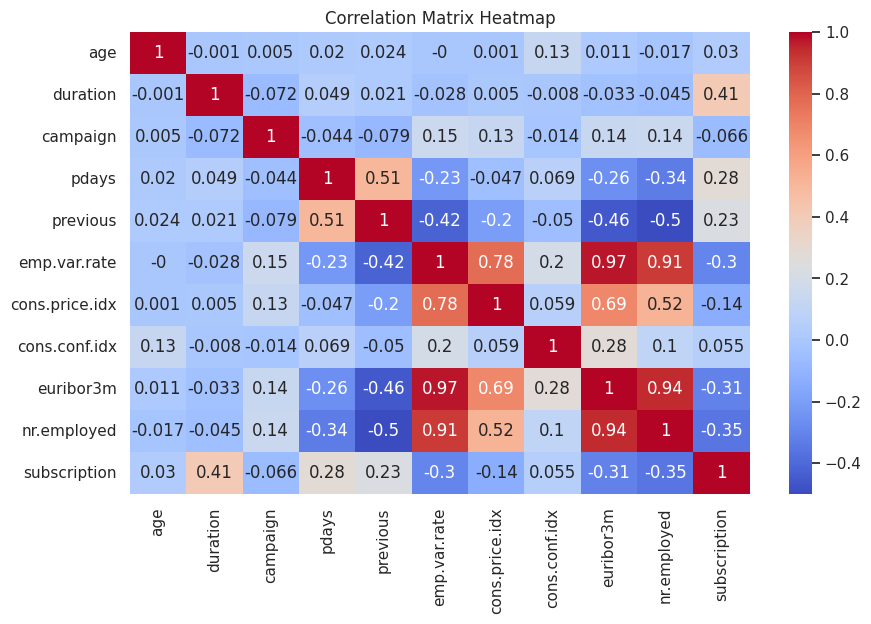

In [ ]:
import numpy as np

# Calculate the correlation matrix
numeric_df = df.select_dtypes(include='number')
correlation_matrix = np.corrcoef(numeric_df, rowvar=False)

# Round correlation coefficients to three decimals
correlation_matrix_rounded = np.round(correlation_matrix, decimals=3)

# Create the heatmap with coolwarm color palette
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_rounded, annot=True, xticklabels=numeric_df.columns, yticklabels=numeric_df.columns, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

* **'euribor3m', 'nr.employed', 'emp.var.rate'** are nearly perfect correlated, so only one variable should be included in the model.
* Apart from duration, **'pdays', 'nr.employed', 'euribor3m'** have relatively higher correlation with 'subscription' then other numerical variables.

## Categorical variables

In [ ]:
# Check categorical variables
categorical_vars = df.select_dtypes(include=['object', 'category']).columns

# Display the categorical variables
print(categorical_vars)

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome'],
      dtype='object')


In [ ]:
# Check unique values of categorical variables
for var in df.select_dtypes(include=['object', 'category']).columns:
    print(f"Unique values in '{var}': {df[var].unique()}")

Unique values in 'job': ['admin.' 'services' 'blue-collar' 'technician' 'housemaid' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
Unique values in 'marital': ['married' 'single' 'divorced' 'unknown']
Unique values in 'education': ['basic.6y' 'high.school' 'basic.9y' 'professional.course' 'unknown'
 'basic.4y' 'university.degree' 'illiterate']
Unique values in 'default': ['no' 'unknown' 'yes']
Unique values in 'housing': ['no' 'yes' 'unknown']
Unique values in 'loan': ['no' 'yes' 'unknown']
Unique values in 'contact': ['telephone' 'cellular']
Unique values in 'month': ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
Unique values in 'day_of_week': ['mon' 'tue' 'wed' 'thu' 'fri']
Unique values in 'poutcome': ['nonexistent' 'failure' 'success']


<ipython-input-126-144524906991>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-126-144524906991>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-126-144524906991>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-126-144524906991>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-126-144524906991>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated a

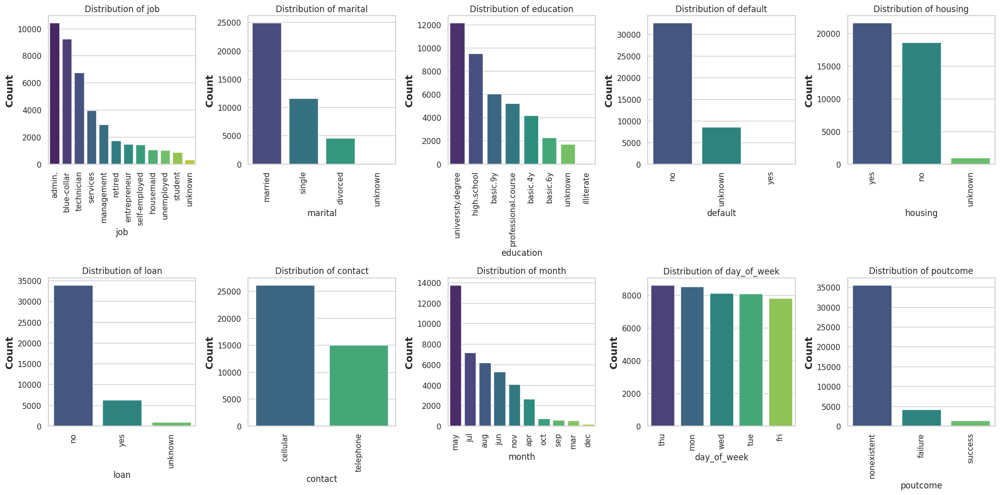

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the visualization
sns.set(style='whitegrid')

# Determine the number of rows and columns for the grid
num_vars = len(categorical_vars)
cols = 5  # Number of columns per row
rows = (num_vars + cols - 1) // cols  # Calculate the number of rows

# Create bar plots in a grid
plt.figure(figsize=(20, rows * 5))
for i, var in enumerate(categorical_vars):
    plt.subplot(rows, cols, i + 1)
    sns.countplot(x=var, data=df, order=df[var].value_counts().index, palette='viridis', legend=False)
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Count', fontsize=14, fontweight='bold')  # Enhance y-axis legend
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

* **'Unknown'** values are unformative and should be treated as missing values.
* We also found that **'default' includes 0 'yes' response**, which is meaningless for further analysis.

# **Data Preparation**

In [ ]:
df_cleaned = df.copy()

## Check missing values

In [ ]:
# Check for missing values in the entire DataFrame
missing_values = df_cleaned.isnull().sum()

# Print the number of missing values in each column
print("Missing values per column:")
print(missing_values)

Missing values per column:
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
subscription      0
dtype: int64


No missing values are detected, however 'Unknown' values will be cleaned in this step.

In [ ]:
# Clean unknown values

# Calculate the number of rows before cleaning
num_rows_before_cleaning = len(df_cleaned)

# Replace 'unknown' values with NaN
df_cleaned.replace('unknown', np.nan, inplace=True)

# Drop rows containing NaN values
df_cleaned.dropna(axis=0, how='any', inplace=True)

# Calculate the number of rows after cleaning
num_rows_after_cleaning = len(df_cleaned)

# Calculate the number of values cleaned
num_values_cleaned = num_rows_before_cleaning - num_rows_after_cleaning

print("Number of values cleaned:", num_values_cleaned)

Number of values cleaned: 10699


In [ ]:
df_cleaned.shape

(30481, 21)

## Check duplicated rows

In [ ]:
# Check for duplicate rows in the entire DataFrame
duplicate_rows = df_cleaned.duplicated()

# Count the number of duplicate rows
num_duplicate_rows = duplicate_rows.sum()

# Print the number of duplicate rows
print(f"Number of duplicate rows in the data set: {num_duplicate_rows}")

Number of duplicate rows in the data set: 10


In [ ]:
# Drop duplicate rows, keeping only the first occurrence
df_cleaned = df_cleaned.drop_duplicates()

In [ ]:
df_cleaned.shape

(30471, 21)

## Handle Outliers

In [ ]:
numerical_w_outliers = ['age', 'campaign', 'duration']

# Calculate the length of the original DataFrame
original_length = len(df_cleaned)

# Loop through each column in numerical_w_outliers and filter outliers
for col in numerical_w_outliers:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1

    # Filter outliers using 1.5xIQR method
    filter_condition = (df_cleaned[col] >= Q1 - 1.5 * IQR) & (df_cleaned[col] <= Q3 + 1.5 * IQR)
    df_cleaned = df_cleaned.loc[filter_condition]

# Calculate the length of the DataFrame after removing outliers
length_after_removing_outliers = len(df_cleaned)

# Calculate the number of outliers detected
num_outliers_detected = original_length - length_after_removing_outliers

print("Number of outliers detected:", num_outliers_detected)

Number of outliers detected: 4149


In [ ]:
df_cleaned.shape

(26322, 21)

## Standardize and Transform Numerical Varibles

In [ ]:
import numpy as np

# Log transformation
# Adding a small constant because log(0) is undefined
df_cleaned['log_duration'] = np.log(df_cleaned['duration'] + 1)
df_cleaned['log_campaign'] = np.log(df_cleaned['campaign'] + 1)

In [ ]:
from sklearn.preprocessing import StandardScaler

# Standardization
scaler = StandardScaler()
variables_to_standardize = ['age', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
                            'euribor3m', 'nr.employed']

# Create new column names for standardized variables
standardized_variable_names = [f'std_{var}' for var in variables_to_standardize]

# Standardize these variables and store them with new names
df_cleaned[standardized_variable_names] = scaler.fit_transform(df_cleaned[variables_to_standardize])

# Display the first few rows to verify the changes
print(df_cleaned.head())

   age         job  marital            education default housing loan  \
0   40      admin.  married             basic.6y      no      no   no   
1   56    services  married          high.school      no      no  yes   
3   59      admin.  married  professional.course      no      no   no   
5   24  technician   single  professional.course      no     yes   no   
6   25    services   single          high.school      no     yes   no   

     contact month day_of_week  ...  nr.employed  subscription  log_duration  \
0  telephone   may         mon  ...       5191.0             0      5.023881   
1  telephone   may         mon  ...       5191.0             0      5.730100   
3  telephone   may         mon  ...       5191.0             0      4.941642   
5  telephone   may         mon  ...       5191.0             0      5.942799   
6  telephone   may         mon  ...       5191.0             0      3.931826   

   log_campaign   std_age  std_emp.var.rate  std_cons.price.idx  \
0      0.6931

In [ ]:
# Binary transformation
df_cleaned['was_contacted'] = (df_cleaned['pdays'] != -1).astype(int)  # Convert boolean to integer (1 for True, 0 for False)
df_cleaned['was_contacted'].value_counts()

0    25218
1     1104
Name: was_contacted, dtype: int64

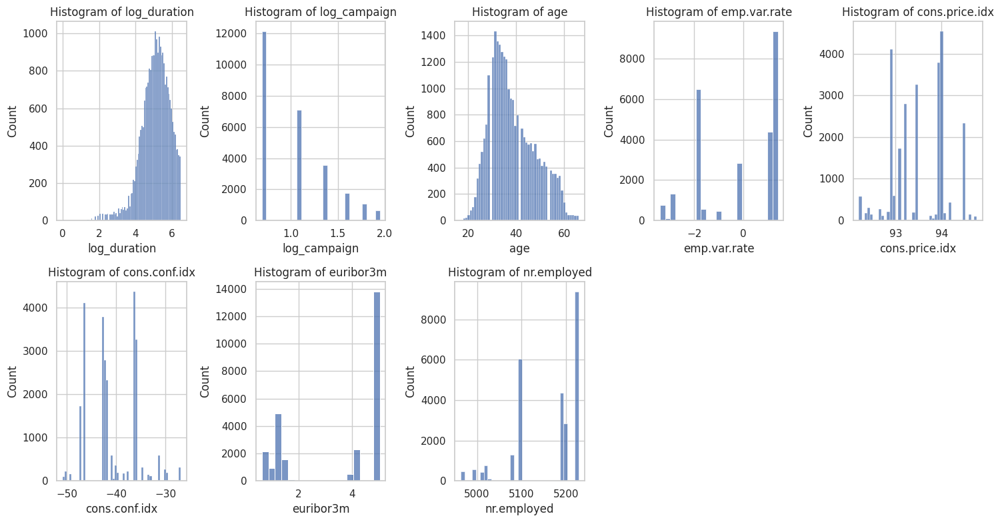

In [ ]:
#Check transformed variables

variables_to_plot = ['log_duration', 'log_campaign', 'age', 'emp.var.rate',
                     'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

# Set up the layout for subplots
num_vars = len(variables_to_plot)
cols = 5
rows = -(-num_vars // cols)  # Ceiling division to calculate the number of rows needed

# Create subplots
plt.figure(figsize=(15, rows * 4))
for i, var in enumerate(variables_to_plot):
    plt.subplot(rows, cols, i + 1)
    sns.histplot(df_cleaned[var])
    plt.title(f'Histogram of {var}')

plt.tight_layout()
plt.show()

In [ ]:
#Store cleaned num vars
numerical_cols_cleaned = ['log_duration', 'log_campaign', 'age', 'emp.var.rate', 'pdays', 'previous',
                          'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'was_contacted',
                          'std_age', 'std_emp.var.rate', 'std_cons.price.idx', 'std_cons.conf.idx',
                          'std_euribor3m', 'std_nr.employed',
                          'subscription']

# Extracting original categorical columns
original_cat_cols = df_cleaned.drop(numerical_cols_cleaned, axis=1)

# Concatenate original categorical columns with cleaned numerical columns
df_cleaned = pd.concat([original_cat_cols, df_cleaned[numerical_cols_cleaned]], axis=1)

# EDA

## Target Variable


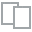
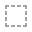
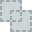
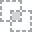
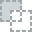
...
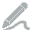
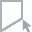
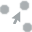
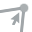
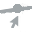

In [ ]:
plot(df_cleaned, 'subscription')

After cleaning, the targer variable is still imbalance (90-10).

## Overview relationship of each variable with target

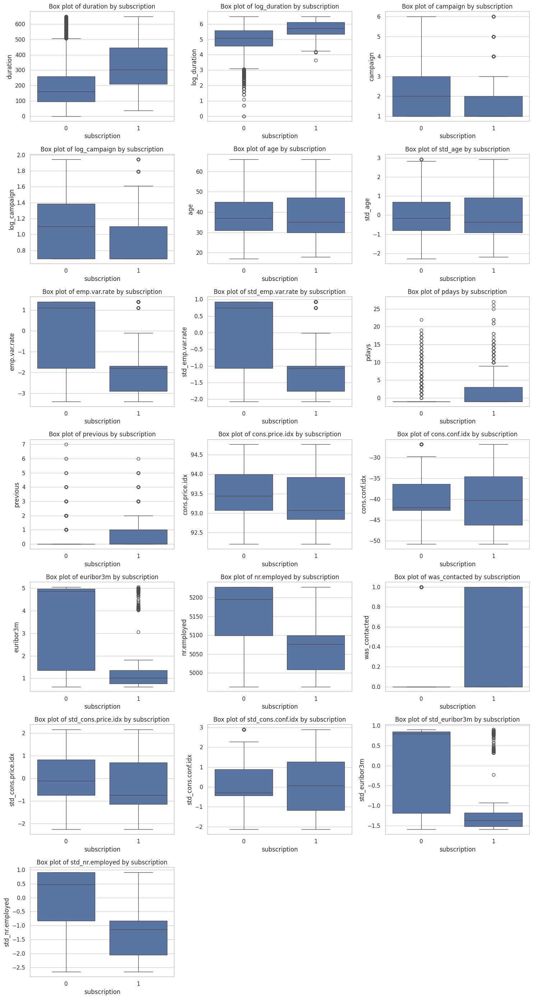

In [ ]:
# Define numerical columns excluding 'was_contacted and 'subscription'
numerical_cols_plot = ['duration', 'log_duration', 'campaign', 'log_campaign',
                       'age', 'std_age', 'emp.var.rate', 'std_emp.var.rate', 'pdays', 'previous',
                       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'was_contacted',
                       'std_cons.price.idx', 'std_cons.conf.idx', 'std_euribor3m', 'std_nr.employed']

# Set up the layout for subplots for numerical variables
num_vars = len(numerical_cols_plot)
cols = 3
rows = -(-num_vars // cols)  # Ceiling division to calculate the number of rows needed

# Create box plots for numerical variables
plt.figure(figsize=(15, rows * 4))
for i, var in enumerate(numerical_cols_plot):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(x='subscription', y=var, data=df_cleaned)
    plt.title(f'Box plot of {var} by subscription')

plt.tight_layout()
plt.show()

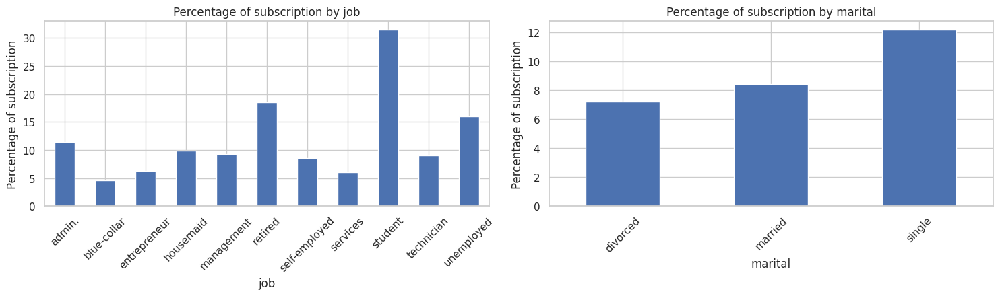

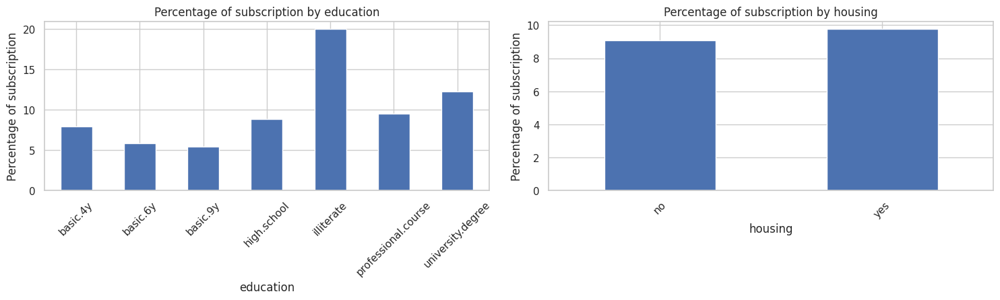

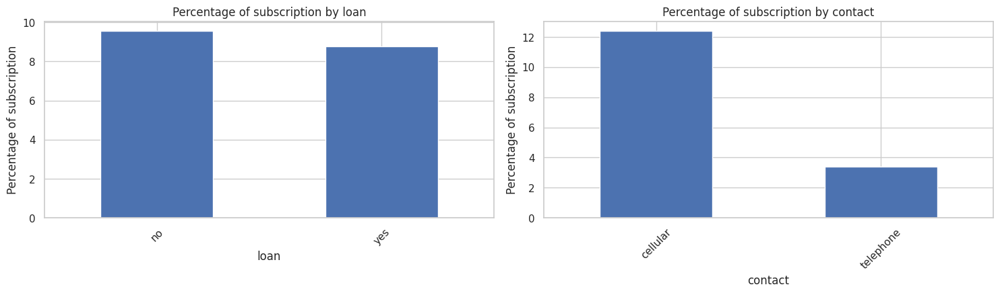

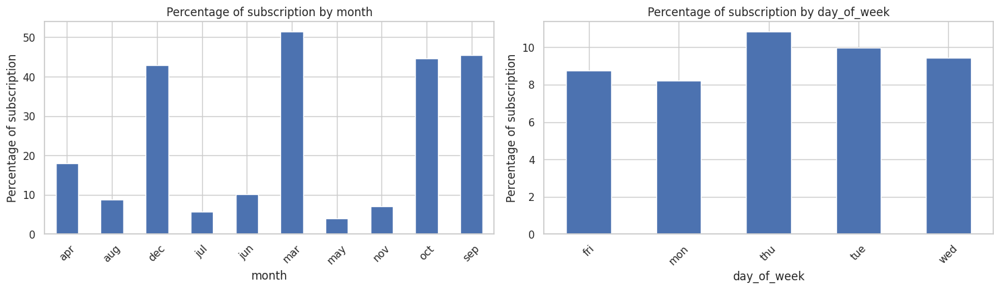

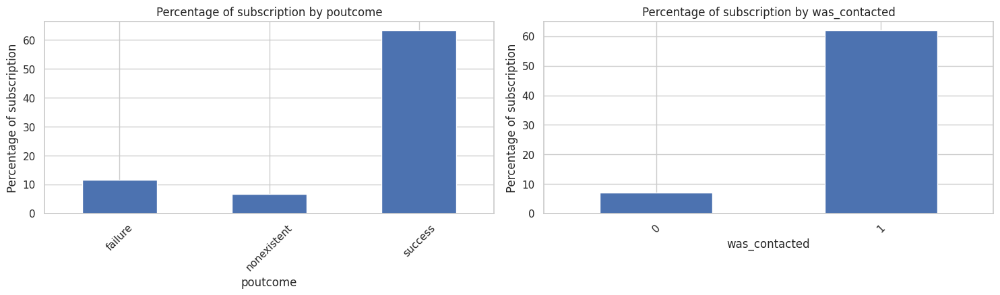

In [ ]:
# Merge 'was_contacted' into categorical_vars & exclude 'default'
categorical_vars_plot = list(df_cleaned.select_dtypes(include='object').columns)
categorical_vars_plot.append('was_contacted')
categorical_vars_plot.remove('default')

# Set up the layout for subplots
num_vars = len(categorical_vars_plot)
cols = 2  # Two plots in a row
rows = -(-num_vars // cols)  # Ceiling division to calculate the number of rows needed

# Create bar charts for categorical variables with percentage of 'subscription' 1
for i, var in enumerate(categorical_vars_plot):
    if i % 2 == 0:  # Start a new row for every second variable
        plt.figure(figsize=(15, rows * 4))
    plt.subplot(rows, cols, i % 2 + 1)
    subscription_1_percentage = df_cleaned.groupby(var)['subscription'].mean() * 100
    subscription_1_percentage.plot(kind='bar')
    plt.title(f'Percentage of subscription by {var}')
    plt.xlabel(var)
    plt.ylabel('Percentage of subscription')
    plt.xticks(rotation=45)
    if i % 2 != 0 or i == num_vars - 1:  # Adjust layout for the last variable in an odd number of variables
        plt.tight_layout()
        plt.show()

## Deep-dive Customer Information

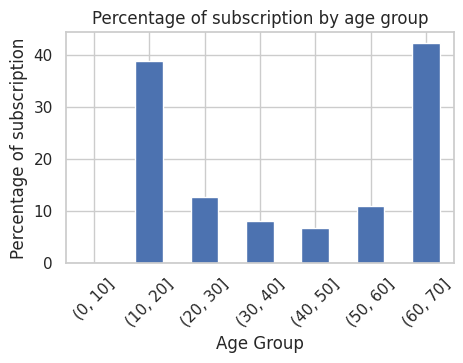

In [ ]:
# Define bin edges for age groups (10 years a bin)
bin_edges = range(0, df_cleaned['age'].max() + 10, 10)

# Bin the 'age' variable
df_cleaned['age_group'] = pd.cut(df_cleaned['age'], bins=bin_edges)

# Calculate the percentage of 'subscription' 1 for each age group
subscription_1_percentage_by_age_group = df_cleaned.groupby('age_group')['subscription'].mean() * 100

# Plot a bar chart of the percentage of 'subscription' 1 by each age group
plt.figure(figsize=(5, 3))
subscription_1_percentage_by_age_group.plot(kind='bar')
plt.title('Percentage of subscription by age group')
plt.xlabel('Age Group')
plt.ylabel('Percentage of subscription')
plt.xticks(rotation=45)
plt.show()

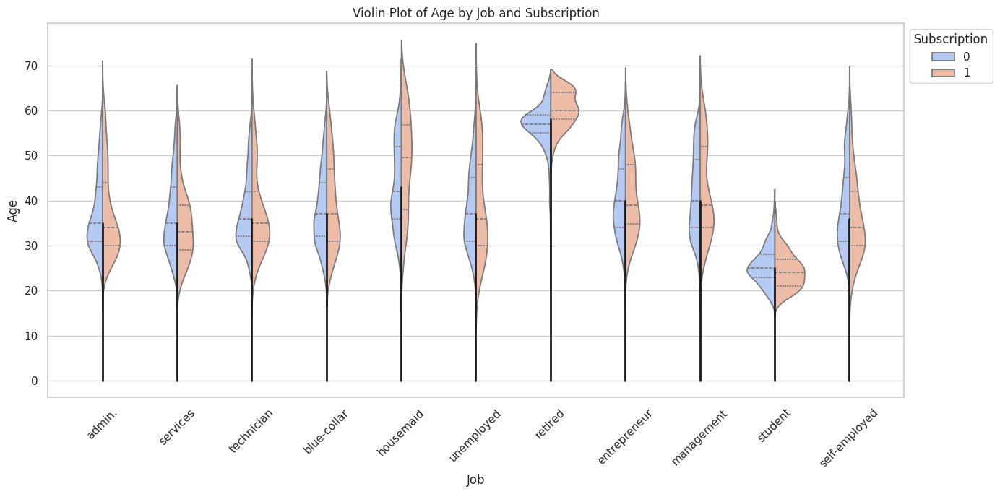

In [ ]:
plt.figure(figsize=(14, 7))
ax = sns.violinplot(data=df_cleaned, x='job', y='age', hue='subscription',
                    palette='coolwarm', split=True, inner='quartile')  # Use 'quartile' to display median and quartiles

for tick, text in zip(ax.get_xticks(), ax.get_xticklabels()):
    job_category = text.get_text()  # the text of the tick
    median_age = df_cleaned[df_cleaned['job'] == job_category]['age'].median()
    # plot a line for median age
    plt.plot([tick, tick], [0, median_age], lw=2, color='k')

plt.title('Violin Plot of Age by Job and Subscription')
plt.xlabel('Job')
plt.ylabel('Age')
plt.xticks(rotation=45)
plt.legend(title='Subscription', loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

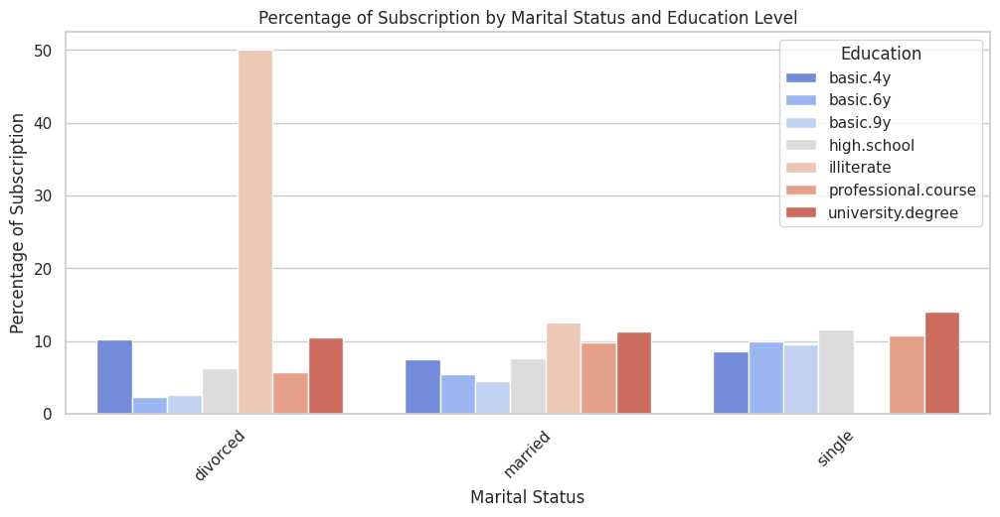

In [ ]:
# Calculate the percentage of subscription 1 for each combination of 'marital' status and 'education' level
subscription_percentage_pivot = df_cleaned.pivot_table(index='marital', columns='education', values='subscription', aggfunc='mean') * 100

# Flatten the pivot table for plotting
subscription_percentage_flat = subscription_percentage_pivot.reset_index().melt(id_vars='marital', var_name='education', value_name='subscription_percentage')

# Plot the bar chart
plt.figure(figsize=(12, 5))
sns.barplot(x='marital', y='subscription_percentage', hue='education', data=subscription_percentage_flat, palette='coolwarm', dodge=True)
plt.title('Percentage of Subscription by Marital Status and Education Level')
plt.xlabel('Marital Status')
plt.ylabel('Percentage of Subscription')
plt.legend(title='Education', loc='upper right')
plt.xticks(rotation=45)
plt.show()

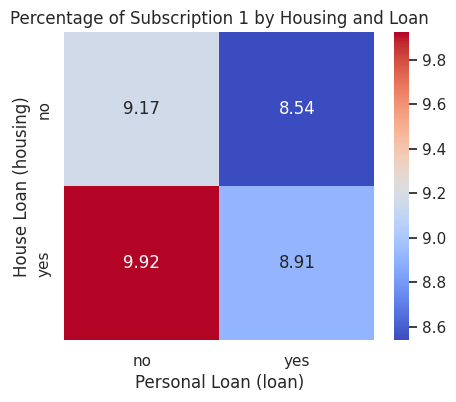

In [ ]:
# Calculate the percentage of 'subscription' 1 for each combination of 'housing' and 'loan'
subscription_percentage_pivot = df_cleaned.pivot_table(index='housing', columns='loan', values='subscription', aggfunc='mean') * 100

# Generate the heatmap
plt.figure(figsize=(5, 4))
sns.heatmap(subscription_percentage_pivot, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Percentage of Subscription 1 by Housing and Loan')
plt.xlabel('Personal Loan (loan)')
plt.ylabel('House Loan (housing)')
plt.show()

## Deep-dive Current Campaign Related Data

In [ ]:
import plotly.express as px

fig = px.scatter(df_cleaned, x="campaign", y="duration", color="subscription")
fig.show()

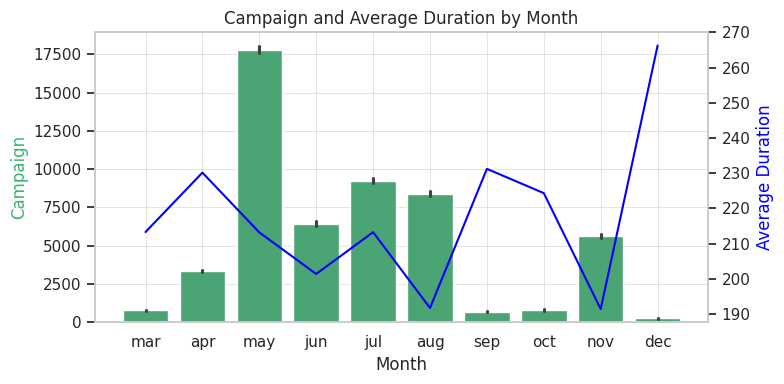

In [ ]:
# Define the order of months
month_order = ['mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

# Convert 'month' column to categorical with custom order
df_cleaned['month'] = pd.Categorical(df_cleaned['month'], categories=month_order, ordered=True)

# Calculate average duration for each month
avg_duration_by_month = df_cleaned.groupby('month')['duration'].mean()

# Create a figure and axis objects
fig, ax1 = plt.subplots(figsize=(8, 4))

# Plot the bar plot for campaign on the primary y-axis
sns.barplot(x='month', y='campaign', data=df_cleaned, ax=ax1, color='mediumseagreen', estimator=sum)
ax1.set_ylabel('Campaign', color='mediumseagreen')

# Create a secondary y-axis for the line plot
ax2 = ax1.twinx()

# Plot the line plot for average 'duration' on the secondary y-axis
sns.lineplot(x=avg_duration_by_month.index, y=avg_duration_by_month.values, ax=ax2, color='blue')
ax2.set_ylabel('Average Duration', color='blue')

# Align gridlines by using common tick positions and settings
ax1.grid(True, which='both', linestyle='-', linewidth=0.5, color='grey', alpha=0.3)  # lighter and finer gridlines
ax2.grid(False)  # turn off grid for secondary axis to avoid double gridlines

# Set common attributes
ax1.set_xlabel('Month')
ax1.set_title('Campaign and Average Duration by Month')
plt.xticks(rotation=45)
plt.tight_layout()  # Adjust layout to make sure everything fits without clipping
plt.show()


## Deep-dive Previous Interaction Performance

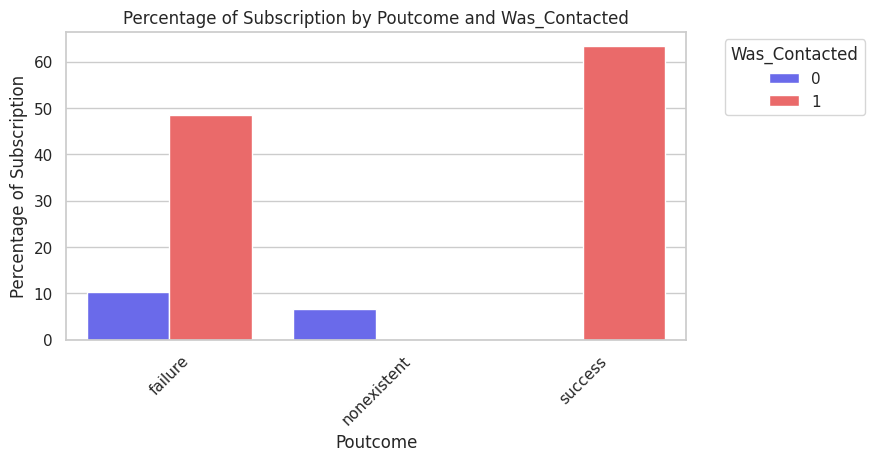

In [ ]:
# Calculate the percentage of subscription 1 for each combination of 'poutcome' and 'was_contacted'
subscription_percentage = df_cleaned.groupby(['poutcome', 'was_contacted'])['subscription'].mean() * 100
subscription_percentage = subscription_percentage.reset_index()

# Create a bar plot
plt.figure(figsize=(8, 4))
sns.barplot(x='poutcome', y='subscription', hue='was_contacted', data=subscription_percentage, palette='seismic')
plt.title('Percentage of Subscription by Poutcome and Was_Contacted')
plt.xlabel('Poutcome')
plt.ylabel('Percentage of Subscription')

# Place legend outside the chart
plt.legend(title='Was_Contacted', loc='upper left', bbox_to_anchor=(1.05, 1))

plt.xticks(rotation=45)
plt.show()

# Preprocessing

## Encode categorical variables

In [ ]:
# List of categorical columns to encode
categorical_cols = df_cleaned.select_dtypes(include=['object','category']).columns
categorical_cols = categorical_cols.drop('age_group')

print(categorical_cols)

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome'],
      dtype='object')


In [ ]:
# Perform one-hot encoding using pandas get_dummies
df_encoded_categorical = pd.get_dummies(df_cleaned[categorical_cols], columns=categorical_cols, drop_first=True)
print(df_encoded_categorical)

       job_blue-collar  job_entrepreneur  job_housemaid  job_management  \
0                    0                 0              0               0   
1                    0                 0              0               0   
3                    0                 0              0               0   
5                    0                 0              0               0   
6                    0                 0              0               0   
...                ...               ...            ...             ...   
41174                0                 0              0               0   
41175                0                 0              0               0   
41177                1                 0              0               0   
41178                0                 0              0               0   
41179                0                 0              0               0   

       job_retired  job_self-employed  job_services  job_student  \
0                0             

In [ ]:
# List of columns to drop
columns_to_drop = ['duration', 'campaign', 'age', 'pdays', 'previous',
                   'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
                   'euribor3m', 'nr.employed']

# Concatenate df_encoded_categorical with numerical variables of df_cleaned
df_model = pd.concat([df_encoded_categorical, df_cleaned.select_dtypes(include=['number'])], axis=1)

# Drop the specified columns
df_model = df_model.drop(columns=columns_to_drop)

# Display the info of df_model
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26322 entries, 0 to 41179
Data columns (total 47 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   job_blue-collar                26322 non-null  uint8  
 1   job_entrepreneur               26322 non-null  uint8  
 2   job_housemaid                  26322 non-null  uint8  
 3   job_management                 26322 non-null  uint8  
 4   job_retired                    26322 non-null  uint8  
 5   job_self-employed              26322 non-null  uint8  
 6   job_services                   26322 non-null  uint8  
 7   job_student                    26322 non-null  uint8  
 8   job_technician                 26322 non-null  uint8  
 9   job_unemployed                 26322 non-null  uint8  
 10  marital_married                26322 non-null  uint8  
 11  marital_single                 26322 non-null  uint8  
 12  education_basic.6y             26322 non-null 

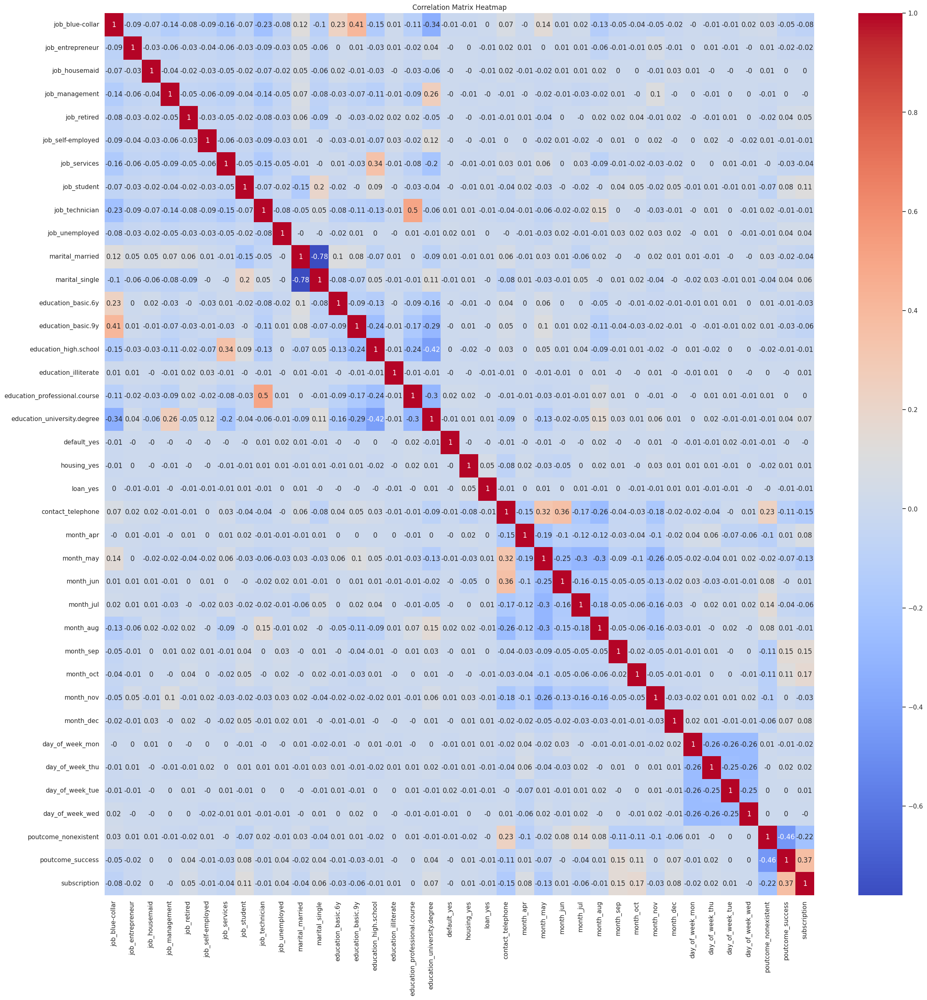

In [ ]:
# Calculate the correlation matrix
dummies_target_df = pd.concat([df_encoded_categorical, df_model['subscription']], axis=1)
correlation_matrix = np.corrcoef(dummies_target_df, rowvar=False)

# Round correlation coefficients to three decimals
correlation_matrix_rounded = np.round(correlation_matrix, decimals=2)

# Create the heatmap with coolwarm color palette
plt.figure(figsize=(28, 28))
sns.heatmap(correlation_matrix_rounded, annot=True, xticklabels=dummies_target_df.columns, yticklabels=dummies_target_df.columns, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

## Feature Selection

In [ ]:
# Separate the features and the target variable
X = df_model.drop('subscription', axis=1)  # Features
y = df_model['subscription']               # Target variable

### Top 10 Feature Selection through Chi-Square

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import MinMaxScaler

numeric_vars_model = df_model.select_dtypes(include=['number']).columns

df_model_2 = df_model.copy() #using MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the data
df_model_2[numeric_vars_model] = scaler.fit_transform(df_model_2[numeric_vars_model])

# Separate the features and the target variable (Data with minmax scaling)
X_2 = df_model_2.drop('subscription', axis=1)  # Features
y_2 = df_model_2['subscription']               # Target variable

# Apply SelectKBest with the Chi-Square test to select the top 10 features
chi_selector = SelectKBest(chi2, k=10)
X_kbest = chi_selector.fit_transform(X_2, y_2)

# Get the selected feature names
selected_features = X_2.columns[chi_selector.get_support()]

# Print the selected feature names
print("Top 10 selected features using Chi-Square:")
print(selected_features)

Top 10 selected features using Chi-Square:
Index(['job_student', 'contact_telephone', 'month_may', 'month_sep',
       'month_oct', 'poutcome_success', 'was_contacted', 'std_emp.var.rate',
       'std_euribor3m', 'std_nr.employed'],
      dtype='object')


### Feature Importance using Wrapper Method

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as rf

selector = SelectFromModel(rf(n_estimators=100, random_state=0))

selector.fit(X, y)
support = selector.get_support()
features = X.loc[:,support].columns.tolist()
print(features)
print(rf(n_estimators=100, random_state=0).fit(X,y).feature_importances_)

['poutcome_success', 'log_duration', 'log_campaign', 'was_contacted', 'std_age', 'std_emp.var.rate', 'std_cons.price.idx', 'std_cons.conf.idx', 'std_euribor3m', 'std_nr.employed']
[8.14608492e-03 4.05635966e-03 3.68776699e-03 8.40785799e-03
 5.31940955e-03 5.07925152e-03 6.65487094e-03 5.13242660e-03
 1.23537148e-02 4.99012743e-03 1.36109288e-02 1.28853943e-02
 3.68908651e-03 7.37480771e-03 1.21061036e-02 2.27346189e-04
 9.50564337e-03 1.40531532e-02 6.98331868e-08 2.12075388e-02
 1.36447882e-02 1.30239105e-02 5.07869228e-03 7.35835356e-03
 4.24911983e-03 2.60419177e-03 2.49154597e-03 3.20343539e-03
 9.29669532e-03 2.81480941e-03 9.82491463e-04 1.28621452e-02
 1.29735828e-02 1.25006214e-02 1.28531570e-02 1.39594545e-02
 3.14945032e-02 2.13529756e-01 3.97610783e-02 3.36875886e-02
 8.88075178e-02 3.41456622e-02 3.08209627e-02 3.99332023e-02
 1.22272286e-01 7.71625059e-02]


### Feature Permutation Importance

In [ ]:
!pip install eli5

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.ensemble import RandomForestClassifier as rf

# Train a random forest classifier on df_cleaned
model = rf(n_estimators=100, random_state=0).fit(X, y)

# Compute permutation importance
perm = PermutationImportance(model, random_state=1).fit(X, y)

# Display the feature importances
eli5.show_weights(perm, feature_names=X.columns.tolist())

Weight,Feature
0.0635 ± 0.0007,log_duration
0.0238 ± 0.0012,std_euribor3m
0.0167 ± 0.0004,std_age
0.0125 ± 0.0005,std_nr.employed
0.0120 ± 0.0007,std_emp.var.rate
0.0116 ± 0.0007,log_campaign
0.0110 ± 0.0004,contact_telephone
0.0094 ± 0.0006,education_university.degree
0.0079 ± 0.0005,housing_yes
0.0067 ± 0.0005,day_of_week_mon


### Feature Selection
Combining the results from EDA, Chi-quare, Wrapper Method, and Permutation, we found out a list of features that should be included in the model, which will be further tested in modelling steps.
* 'poutcome_success', ‘poutcome_nonexistent’,
* 'was_contacted',
* ‘log_campaign’,
* 'std_euribor3m', 'std_cons.price.idx', 'std_cons.conf.idx',
* 'std_age',
* 'contact_telephone',
* 'month_may', 'month_sep', 'month_oct',
* 'education_university.degree',
* ‘day_of_week_mon’, ‘day_of_week_tue’, ‘day_of_week_wed’, ‘day_of_week_thu’,
* ‘marital_single’, ‘marital_married’,
* ‘job_technician’, 'job_student', ‘job_retired’, ‘job_unemployed’,
* ‘housing_yes’


# Modelling

## Selecting features

In [ ]:
# Selecting the important features using scaled data
selected_features = [
    'poutcome_success', 'poutcome_nonexistent',
    'was_contacted',
    'log_campaign',
    'std_euribor3m', 'std_cons.price.idx', 'std_cons.conf.idx',
    'std_age',
    'contact_telephone',
    'month_may', 'month_sep', 'month_oct',
    'education_university.degree',
    'day_of_week_mon', 'day_of_week_tue', 'day_of_week_wed', 'day_of_week_thu',
    'marital_single', 'marital_married',
    'job_technician', 'job_student', 'job_retired', 'job_unemployed',
    'housing_yes'
]

# Creating the feature matrix (X) and target vector (y)
X_model = df_model[selected_features]
y_model = df_model['subscription']

In [ ]:
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler

# Split the features and target variable into 'data' and 'test' sets with an 80-20 ratio
X_data, X_test, y_data, y_test = train_test_split(
    X_model,
    y_model,
    test_size=0.2,    # 20% for the test set
    random_state=42,  # Ensuring reproducibility of results
    stratify=y_model  # Preserving the distribution of 'subscription' in the split
)

# Further split the 'data' set into 'training' and 'validation' sets with an 80-20 ratio
X_train, X_val, y_train, y_val = train_test_split(
    X_data,
    y_data,
    test_size=0.2,    # 20% of the 'data' set for the validation set
    random_state=42,  # Ensuring reproducibility of results
    stratify=y_data   # Preserving the distribution of 'subscription' in the split
)

# Perform under-sampling to balance the dataset
undersampler_80_20 = RandomUnderSampler(sampling_strategy=0.25, random_state=42)
X_train_80_20, y_train_80_20 = undersampler_80_20.fit_resample(X_train, y_train)

undersampler_70_30 = RandomUnderSampler(sampling_strategy=0.428, random_state=42)
X_train_70_30, y_train_70_30 = undersampler_70_30.fit_resample(X_train, y_train)

## Logistic Regression

### Train model

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score

# Fit Logistic Regression models (Applying MLE)
# Normal Model
model_normal_lr = LogisticRegression()
model_normal_lr.fit(X_train, y_train)  # MLE applied here

# 80-20 Under-sampled Model
model_80_20_lr = LogisticRegression()
model_80_20_lr.fit(X_train_80_20, y_train_80_20)  # MLE applied here

# 70-30 Under-sampled Model
model_70_30_lr = LogisticRegression()
model_70_30_lr.fit(X_train_70_30, y_train_70_30)  # MLE applied here

# Predictions for each model on validation set
y_pred_normal_lr = model_normal_lr.predict(X_val)
y_pred_80_20_lr = model_80_20_lr.predict(X_val)
y_pred_70_30_lr = model_70_30_lr.predict(X_val)

# Calculate performance metrics for each model on validation set
accuracy_normal_lr = accuracy_score(y_val, y_pred_normal_lr)
accuracy_80_20_lr = accuracy_score(y_val, y_pred_80_20_lr)
accuracy_70_30_lr = accuracy_score(y_val, y_pred_70_30_lr)

auc_normal_lr = roc_auc_score(y_val, model_normal_lr.predict_proba(X_val)[:, 1])
auc_80_20_lr = roc_auc_score(y_val, model_80_20_lr.predict_proba(X_val)[:, 1])
auc_70_30_lr = roc_auc_score(y_val, model_70_30_lr.predict_proba(X_val)[:, 1])

f1_normal_lr = f1_score(y_val, y_pred_normal_lr)
f1_80_20_lr = f1_score(y_val, y_pred_80_20_lr)
f1_70_30_lr = f1_score(y_val, y_pred_70_30_lr)

# Create a summary table
summary_data = {
    'Model': ['Normal', '80-20 Under-sampled', '70-30 Under-sampled'],
    'Accuracy': [accuracy_normal_lr, accuracy_80_20_lr, accuracy_70_30_lr],
    'AUC': [auc_normal_lr, auc_80_20_lr, auc_70_30_lr],
    'F1-score': [f1_normal_lr, f1_80_20_lr, f1_70_30_lr]
}
summary_table = pd.DataFrame(summary_data)

# Print summary table
print(summary_table)

                 Model  Accuracy       AUC  F1-score
0               Normal  0.919991  0.867656  0.397138
1  80-20 Under-sampled  0.896724  0.869310  0.488837
2  70-30 Under-sampled  0.878205  0.870949  0.500487


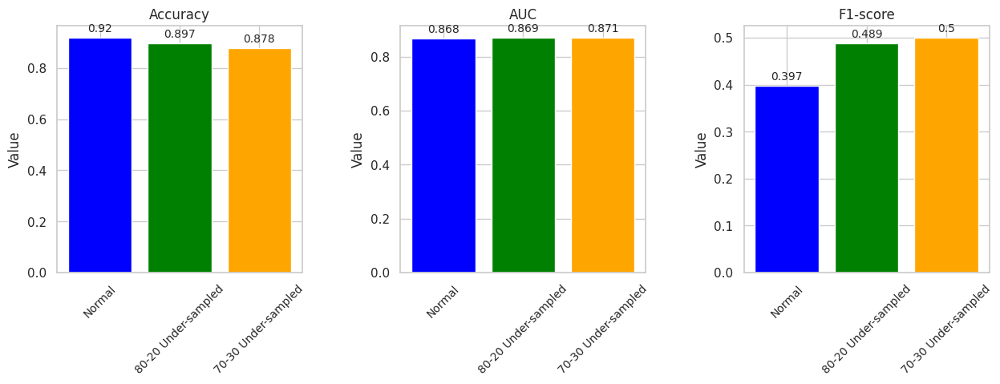

In [ ]:
# Retrieve the metric values
accuracy_values_lr = [accuracy_normal_lr, accuracy_80_20_lr, accuracy_70_30_lr]
auc_values_lr = [auc_normal_lr, auc_80_20_lr, auc_70_30_lr]
f1_values_lr = [f1_normal_lr, f1_80_20_lr, f1_70_30_lr]

# Create lists for metrics
metrics_lr = ['Accuracy', 'AUC', 'F1-score']

# Create subplots for bar charts
fig, axes = plt.subplots(1, 3, figsize=(15, 4))  # Decreased the figure height to 4 inches
fig.subplots_adjust(hspace=0.3, wspace=0.4)

# Plot bar charts for each metric
for i, metric in enumerate(metrics_lr):
    ax = axes[i]

    if metric == 'Accuracy':
        bars = ax.bar(summary_table['Model'], accuracy_values_lr, color=['blue', 'green', 'orange'])
    elif metric == 'AUC':
        bars = ax.bar(summary_table['Model'], auc_values_lr, color=['blue', 'green', 'orange'])
    elif metric == 'F1-score':
        bars = ax.bar(summary_table['Model'], f1_values_lr, color=['blue', 'green', 'orange'])

    ax.set_title(metric)
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=45, labelrotation=45, labelsize='small')  # Rotate x-axis labels by 45 degrees and set smaller font size

    # Display data labels
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(round(height, 3)),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize='small')

plt.show()

The normal approach shows highest accuracy, however as the target variable is imbalanced, the **70-30 under-sampling approach will be more suitable** as it shows the highest AUC and F1-score, which means that it will be better in detecting customers who subscribe the Telecom plan.

### Assess best model on test set

In [ ]:
import statsmodels.api as sm

# Fit the 70-30 under-sampled Model on the test set
model_70_30_test_lr = sm.Logit(y_test, sm.add_constant(X_test)).fit()

# Print out the Logit summary2
print("Summary Table for 70-30 Under-sampled Model on Test Set:")
print(model_70_30_test_lr.summary2())

# Predictions for the 70-30 under-sampled Model on test set
y_pred_70_30_test_lr = model_70_30_lr.predict(X_test)

# Calculate performance metrics for the 70-30 under-sampled Model on test set
accuracy_70_30_test_lr = accuracy_score(y_test, y_pred_70_30_test_lr)
auc_70_30_test_lr = roc_auc_score(y_test, model_70_30_lr.predict_proba(X_test)[:, 1])
f1_70_30_test_lr = f1_score(y_test, y_pred_70_30_test_lr)

# Print out performance metrics on test set
print("\nPerformance Metrics for 70-30 Under-sampled Model on Test Set:")
print(f"Accuracy: {accuracy_70_30_test_lr:.4f}")
print(f"AUC: {auc_70_30_test_lr:.4f}")
print(f"F1-score: {f1_70_30_test_lr:.4f}")

Optimization terminated successfully.
         Current function value: 0.209338
         Iterations 8
Summary Table for 70-30 Under-sampled Model on Test Set:
                               Results: Logit
Model:                  Logit               Method:              MLE        
Dependent Variable:     subscription        Pseudo R-squared:    0.330      
Date:                   2024-06-02 01:40    AIC:                 2254.3283  
No. Observations:       5265                BIC:                 2418.5492  
Df Model:               24                  Log-Likelihood:      -1102.2    
Df Residuals:           5240                LL-Null:             -1645.8    
Converged:              1.0000              LLR p-value:         2.4768e-214
No. Iterations:         8.0000              Scale:               1.0000     
----------------------------------------------------------------------------
                             Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-------------------------

In [ ]:
summary_table = model_70_30_test_lr.summary2().tables[1]
print(summary_table)

# Convert the summary table to a DataFrame
summary_df = pd.DataFrame(summary_table)

# Ensure the index (feature names) are included as a column
summary_df.reset_index(inplace=True)

# Save the DataFrame to an Excel file
summary_df.to_excel('summary_table_70_30_under_sampled_model.xlsx', index=False)

                                Coef.  Std.Err.          z         P>|z|  \
const                       -3.683121  0.348006 -10.583500  3.554286e-26   
poutcome_success             0.296217  0.478849   0.618601  5.361793e-01   
poutcome_nonexistent         0.823332  0.172536   4.771935  1.824644e-06   
was_contacted                1.765953  0.482524   3.659823  2.523898e-04   
log_campaign                -0.039668  0.164612  -0.240980  8.095708e-01   
std_euribor3m               -1.467909  0.083129 -17.658262  8.790551e-70   
std_cons.price.idx           0.246247  0.066454   3.705528  2.109512e-04   
std_cons.conf.idx            0.222094  0.054912   4.044527  5.242876e-05   
std_age                      0.045068  0.063211   0.712980  4.758582e-01   
contact_telephone           -0.793817  0.190832  -4.159767  3.185728e-05   
month_may                   -1.105820  0.162016  -6.825353  8.770940e-12   
month_sep                   -0.358431  0.260102  -1.378043  1.681900e-01   
month_oct   

Test set performance metrics show relatively no difference from the validation set one. Pseudo R-squared 0.33 indicates that the model explains approximately 33% of the variance in the outcome variable.

## K-Nearest Neighbor

### Train model

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score

# Fit KNN models with F1 score as the scoring metric
knn_params = {'n_neighbors': [3, 5, 7, 9, 11]}
knn_grid_normal = GridSearchCV(KNeighborsClassifier(), knn_params, cv=5, scoring='f1', refit=False)
knn_grid_normal.fit(X_train, y_train)

knn_grid_80_20 = GridSearchCV(KNeighborsClassifier(), knn_params, cv=5, scoring='f1', refit=False)
knn_grid_80_20.fit(X_train_80_20, y_train_80_20)

knn_grid_70_30 = GridSearchCV(KNeighborsClassifier(), knn_params, cv=5, scoring='f1', refit=False)
knn_grid_70_30.fit(X_train_70_30, y_train_70_30)

# Get the best parameters for each model
best_params_normal = knn_grid_normal.best_params_
best_params_80_20 = knn_grid_80_20.best_params_
best_params_70_30 = knn_grid_70_30.best_params_

# Print the best n_neighbors for each model
print("Best n_neighbors for Normal Model:", best_params_normal['n_neighbors'])
print("Best n_neighbors for 80-20 Under-sampled Model:", best_params_80_20['n_neighbors'])
print("Best n_neighbors for 70-30 Under-sampled Model:", best_params_70_30['n_neighbors'])

Best n_neighbors for Normal Model: 5
Best n_neighbors for 80-20 Under-sampled Model: 5
Best n_neighbors for 70-30 Under-sampled Model: 11


In [ ]:
# Apply the best parameters to the KNN models
knn_normal_best = KNeighborsClassifier(n_neighbors=best_params_normal['n_neighbors'])
knn_80_20_best = KNeighborsClassifier(n_neighbors=best_params_80_20['n_neighbors'])
knn_70_30_best = KNeighborsClassifier(n_neighbors=best_params_70_30['n_neighbors'])

# Fit the models with the best parameters on the training data
knn_normal_best.fit(X_train, y_train)
knn_80_20_best.fit(X_train_80_20, y_train_80_20)
knn_70_30_best.fit(X_train_70_30, y_train_70_30)

# Predictions for each model on validation set using the best parameters
y_pred_normal_knn_best = knn_normal_best.predict(X_val)
y_pred_80_20_knn_best = knn_80_20_best.predict(X_val)
y_pred_70_30_knn_best = knn_70_30_best.predict(X_val)

# Calculate performance metrics for each model on validation set using the best parameters
accuracy_normal_knn_best = accuracy_score(y_val, y_pred_normal_knn_best)
accuracy_80_20_knn_best = accuracy_score(y_val, y_pred_80_20_knn_best)
accuracy_70_30_knn_best = accuracy_score(y_val, y_pred_70_30_knn_best)

f1_normal_knn_best = f1_score(y_val, y_pred_normal_knn_best)
f1_80_20_knn_best = f1_score(y_val, y_pred_80_20_knn_best)
f1_70_30_knn_best = f1_score(y_val, y_pred_70_30_knn_best)

auc_normal_knn_best = roc_auc_score(y_val, model_normal_lr.predict_proba(X_val)[:, 1])
auc_80_20_knn_best = roc_auc_score(y_val, model_80_20_lr.predict_proba(X_val)[:, 1])
auc_70_30_knn_best = roc_auc_score(y_val, model_70_30_lr.predict_proba(X_val)[:, 1])

# Create a summary table for the models with the best parameters
summary_data_best = {
    'Model': ['Normal (Best)', '80-20 Under-sampled (Best)', '70-30 Under-sampled (Best)'],
    'Accuracy': [accuracy_normal_knn_best, accuracy_80_20_knn_best, accuracy_70_30_knn_best],
    'F1-score': [f1_normal_knn_best, f1_80_20_knn_best, f1_70_30_knn_best],
    'AUC': [auc_normal_knn_best, auc_80_20_knn_best, auc_70_30_knn_best]
}
summary_table_best = pd.DataFrame(summary_data_best)

# Print summary table for models with best parameters
print(summary_table_best)

                        Model  Accuracy  F1-score       AUC
0               Normal (Best)  0.908594  0.412214  0.867656
1  80-20 Under-sampled (Best)  0.891738  0.488789  0.869310
2  70-30 Under-sampled (Best)  0.877968  0.501938  0.870949


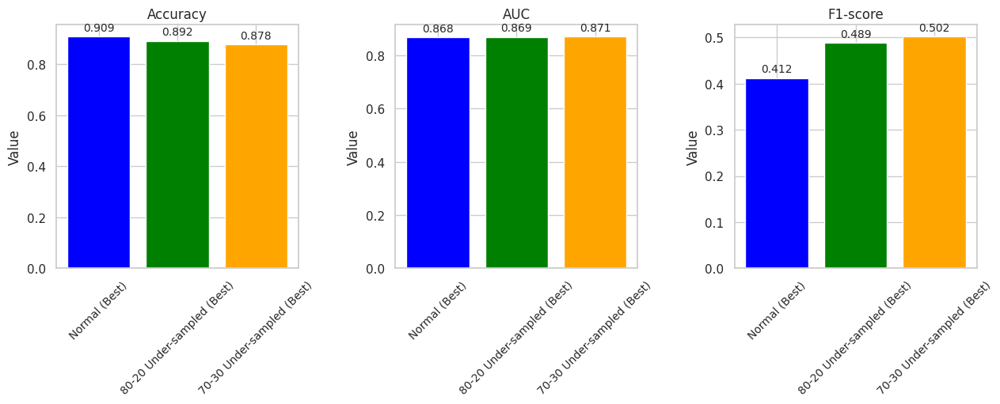

In [ ]:
# Retrieve the metric values for KNN models
accuracy_values_knn = [accuracy_normal_knn_best, accuracy_80_20_knn_best, accuracy_70_30_knn_best]
auc_values_knn = [auc_normal_knn_best, auc_80_20_knn_best, auc_70_30_knn_best]
f1_values_knn = [f1_normal_knn_best, f1_80_20_knn_best, f1_70_30_knn_best]

# Create lists for metrics for KNN
metrics_knn = ['Accuracy', 'AUC', 'F1-score']

# Create subplots for bar charts
fig, axes = plt.subplots(1, 3, figsize=(15, 4))  # Decreased the figure height to 4 inches
fig.subplots_adjust(hspace=0.3, wspace=0.4)

# Plot bar charts for each metric for KNN
for i, metric in enumerate(metrics_knn):
    ax = axes[i]

    if metric == 'Accuracy':
        bars = ax.bar(summary_table_best['Model'], accuracy_values_knn, color=['blue', 'green', 'orange'])
    elif metric == 'AUC':
        bars = ax.bar(summary_table_best['Model'], auc_values_knn, color=['blue', 'green', 'orange'])
    elif metric == 'F1-score':
        bars = ax.bar(summary_table_best['Model'], f1_values_knn, color=['blue', 'green', 'orange'])

    ax.set_title(metric)
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=45, labelrotation=45, labelsize='small')  # Rotate x-axis labels by 45 degrees and set smaller font size

    # Display data labels
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(round(height, 3)),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize='small')

plt.show()

### Assess best model on test set

In [ ]:
# Fit the 70-30 under-sampled KNN Model on the test set
best_knn_model_70_30 = KNeighborsClassifier(n_neighbors=best_params_70_30['n_neighbors'])
best_knn_model_70_30.fit(X_train_70_30, y_train_70_30)

# Predictions for the 70-30 under-sampled KNN Model on test set
y_pred_70_30_test_knn = best_knn_model_70_30.predict(X_test)

# Calculate performance metrics for the 70-30 under-sampled KNN Model on test set
accuracy_70_30_test_knn = accuracy_score(y_test, y_pred_70_30_test_knn)
auc_70_30_test_knn = roc_auc_score(y_test, best_knn_model_70_30.predict_proba(X_test)[:, 1])
f1_70_30_test_knn = f1_score(y_test, y_pred_70_30_test_knn)

# Print out performance metrics on test set for KNN Model
print("\nPerformance Metrics for 70-30 Under-sampled KNN Model on Test Set:")
print(f"Accuracy: {accuracy_70_30_test_knn:.4f}")
print(f"AUC: {auc_70_30_test_knn:.4f}")
print(f"F1-score: {f1_70_30_test_knn:.4f}")


Performance Metrics for 70-30 Under-sampled KNN Model on Test Set:
Accuracy: 0.8737
AUC: 0.8688
F1-score: 0.5171


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



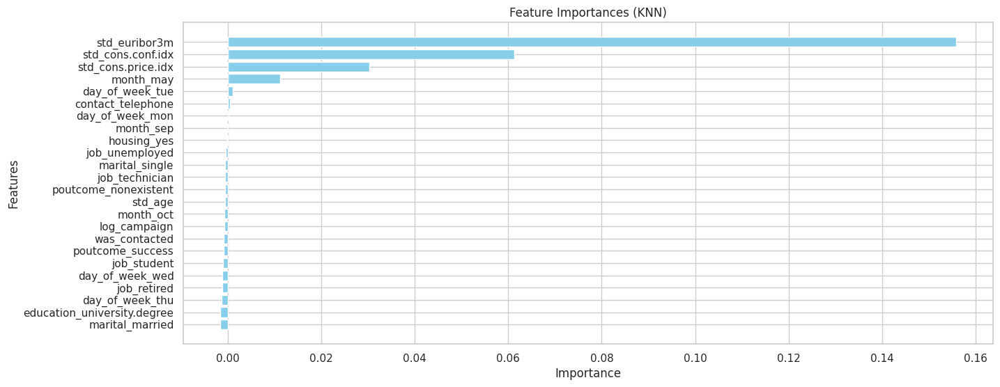

In [ ]:
from sklearn.inspection import permutation_importance

# Fit the 70-30 under-sampled KNN Model on the test set (if not already fitted)
best_knn_model_70_30 = KNeighborsClassifier(n_neighbors=best_params_70_30['n_neighbors'])
best_knn_model_70_30.fit(X_train_70_30, y_train_70_30)

# Calculate permutation feature importance
result = permutation_importance(best_knn_model_70_30, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Extract feature importances
feature_importances = result.importances_mean
features = X_test.columns

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(15, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances (KNN)')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()


## Decision Tree

### Train model

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Define parameters for GridSearch
tree_params = {'max_depth': [3, 5, 7, 9, 11], 'min_samples_split': [2, 5, 10]}

# Fit Decision Tree models with F1 score as the scoring metric
tree_grid_normal = GridSearchCV(DecisionTreeClassifier(), tree_params, cv=5, scoring='f1', refit=True)
tree_grid_normal.fit(X_train, y_train)

tree_grid_80_20 = GridSearchCV(DecisionTreeClassifier(), tree_params, cv=5, scoring='f1', refit=True)
tree_grid_80_20.fit(X_train_80_20, y_train_80_20)

tree_grid_70_30 = GridSearchCV(DecisionTreeClassifier(), tree_params, cv=5, scoring='f1', refit=True)
tree_grid_70_30.fit(X_train_70_30, y_train_70_30)

# Get the best parameters for each model
best_params_normal_tree = tree_grid_normal.best_params_
best_params_80_20_tree = tree_grid_80_20.best_params_
best_params_70_30_tree = tree_grid_70_30.best_params_

# Print the best parameters for each model
print("Best parameters for Normal Model:", best_params_normal_tree)
print("Best parameters for 80-20 Under-sampled Model:", best_params_80_20_tree)
print("Best parameters for 70-30 Under-sampled Model:", best_params_70_30_tree)

Best parameters for Normal Model: {'max_depth': 7, 'min_samples_split': 2}
Best parameters for 80-20 Under-sampled Model: {'max_depth': 5, 'min_samples_split': 5}
Best parameters for 70-30 Under-sampled Model: {'max_depth': 5, 'min_samples_split': 2}


In [ ]:
# Apply the best parameters to the validation set
best_tree_model_normal = tree_grid_normal.best_estimator_
best_tree_model_80_20 = tree_grid_80_20.best_estimator_
best_tree_model_70_30 = tree_grid_70_30.best_estimator_

# Predictions for each model on validation set
y_pred_normal_tree = best_tree_model_normal.predict(X_val)
y_pred_80_20_tree = best_tree_model_80_20.predict(X_val)
y_pred_70_30_tree = best_tree_model_70_30.predict(X_val)

# Calculate performance metrics for each model on validation set
accuracy_normal_tree = accuracy_score(y_val, y_pred_normal_tree)
accuracy_80_20_tree = accuracy_score(y_val, y_pred_80_20_tree)
accuracy_70_30_tree = accuracy_score(y_val, y_pred_70_30_tree)

auc_normal_tree = roc_auc_score(y_val, best_tree_model_normal.predict_proba(X_val)[:, 1])
auc_80_20_tree = roc_auc_score(y_val, best_tree_model_80_20.predict_proba(X_val)[:, 1])
auc_70_30_tree = roc_auc_score(y_val, best_tree_model_70_30.predict_proba(X_val)[:, 1])

f1_normal_tree = f1_score(y_val, y_pred_normal_tree)
f1_80_20_tree = f1_score(y_val, y_pred_80_20_tree)
f1_70_30_tree = f1_score(y_val, y_pred_70_30_tree)

# Create a summary table
summary_data_tree = {
    'Model': ['Normal', '80-20 Under-sampled', '70-30 Under-sampled'],
    'Accuracy': [accuracy_normal_tree, accuracy_80_20_tree, accuracy_70_30_tree],
    'AUC': [auc_normal_tree, auc_80_20_tree, auc_70_30_tree],
    'F1-score': [f1_normal_tree, f1_80_20_tree, f1_70_30_tree]
}
summary_table_tree = pd.DataFrame(summary_data_tree)

# Print summary table
print(summary_table_tree)

                 Model  Accuracy       AUC  F1-score
0               Normal  0.923552  0.868785  0.498442
1  80-20 Under-sampled  0.890788  0.858456  0.538153
2  70-30 Under-sampled  0.876306  0.869019  0.530207


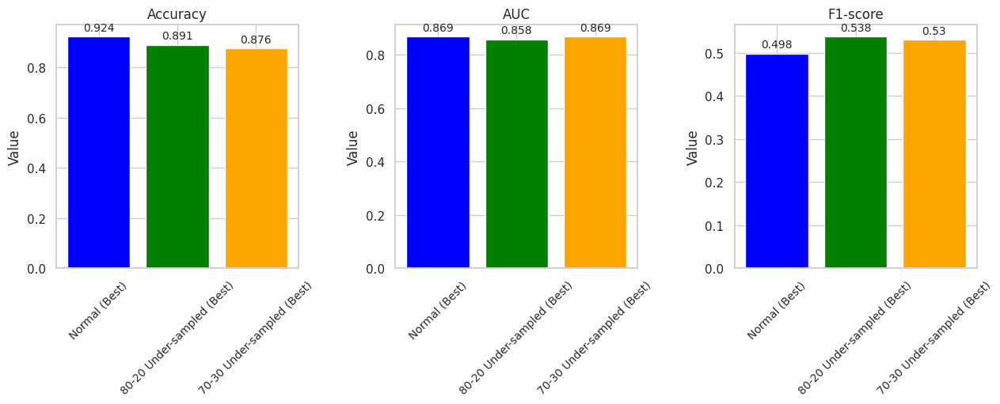

In [ ]:
# Retrieve the metric values for Decision Tree models
accuracy_values_tree = [accuracy_normal_tree, accuracy_80_20_tree, accuracy_70_30_tree]
auc_values_tree = [auc_normal_tree, auc_80_20_tree, auc_70_30_tree]
f1_values_tree = [f1_normal_tree, f1_80_20_tree, f1_70_30_tree]

# Create lists for metrics for Decision Tree
metrics_tree = ['Accuracy', 'AUC', 'F1-score']

# Create subplots for bar charts
fig, axes = plt.subplots(1, 3, figsize=(15, 4))  # Decreased the figure height to 4 inches
fig.subplots_adjust(hspace=0.3, wspace=0.4)

# Plot bar charts for each metric for Decision Tree
for i, metric in enumerate(metrics_tree):
    ax = axes[i]

    if metric == 'Accuracy':
        bars = ax.bar(summary_table_best['Model'], accuracy_values_tree, color=['blue', 'green', 'orange'])
    elif metric == 'AUC':
        bars = ax.bar(summary_table_best['Model'], auc_values_tree, color=['blue', 'green', 'orange'])
    elif metric == 'F1-score':
        bars = ax.bar(summary_table_best['Model'], f1_values_tree, color=['blue', 'green', 'orange'])

    ax.set_title(metric)
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=45, labelrotation=45, labelsize='small')

    # Display data labels
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(round(height, 3)),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize='small')

plt.show()

### Assess model on test set

In [ ]:
# Fit the 80-20 under-sampled Decision Tree Model on the test set
best_tree_model_80_20 = DecisionTreeClassifier(max_depth=best_params_80_20_tree['max_depth'],
                                               min_samples_split=best_params_80_20_tree['min_samples_split'])
best_tree_model_80_20.fit(X_train_80_20, y_train_80_20)

# Predictions for the 80-20 under-sampled Decision Tree Model on test set
y_pred_80_20_test_tree = best_tree_model_80_20.predict(X_test)

# Calculate performance metrics for the 80-20 under-sampled Decision Tree Model on test set
accuracy_80_20_test_tree = accuracy_score(y_test, y_pred_80_20_test_tree)
auc_80_20_test_tree = roc_auc_score(y_test, best_tree_model_80_20.predict_proba(X_test)[:, 1])
f1_80_20_test_tree = f1_score(y_test, y_pred_80_20_test_tree)

# Print out performance metrics on test set for Decision Tree Model
print("\nPerformance Metrics for 80-20 Under-sampled Decision Tree Model on Test Set:")
print(f"Accuracy: {accuracy_80_20_test_tree:.4f}")
print(f"AUC: {auc_80_20_test_tree:.4f}")
print(f"F1-score: {f1_80_20_test_tree:.4f}")


Performance Metrics for 80-20 Under-sampled Decision Tree Model on Test Set:
Accuracy: 0.8809
AUC: 0.8675
F1-score: 0.5254


In [ ]:
!pip install graphviz pydotplus

### Result for Interpretation

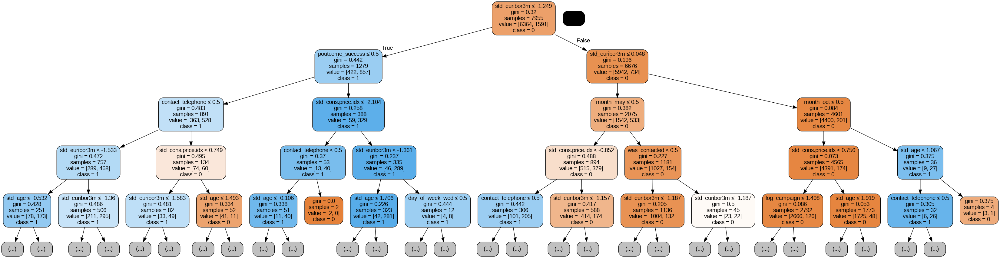

In [ ]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
import matplotlib.pyplot as plt

# Fit the 80-20 under-sampled Decision Tree Model on the test set (if not already fitted)
best_tree_model_80_20 = DecisionTreeClassifier(max_depth=best_params_80_20_tree['max_depth'],
                                               min_samples_split=best_params_80_20_tree['min_samples_split'])
best_tree_model_80_20.fit(X_train_80_20, y_train_80_20)

# Export the decision tree to a DOT file
dot_data = export_graphviz(
    best_tree_model_80_20,
    out_file=None,
    feature_names=X_train.columns,
    class_names=['0', '1'],
    filled=True,
    rounded=True,
    special_characters=True,
    max_depth=4  # Limiting the depth for better visualization
)

# Convert DOT file to PNG image
graph = pydotplus.graph_from_dot_data(dot_data)

# Display the image in Jupyter Notebook
Image(graph.create_png())


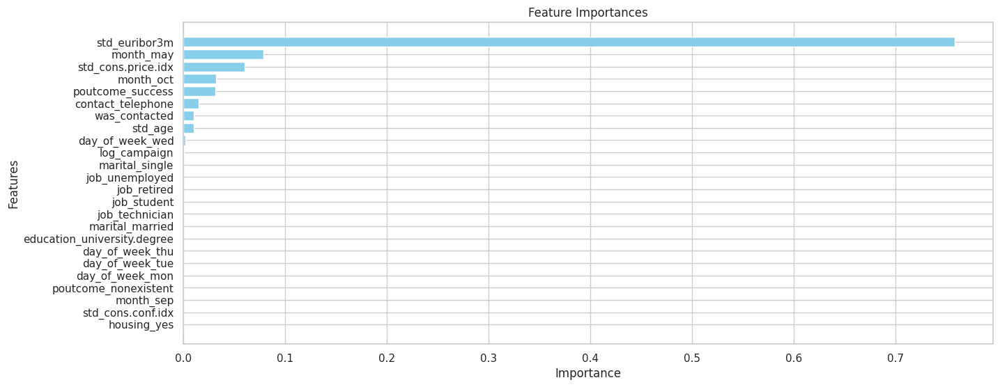

In [ ]:
# Extract feature importances
feature_importances = best_tree_model_80_20.feature_importances_
features = X_test.columns

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(15, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

## Random Forest

### Train model

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Define parameters for GridSearch
forest_params = {'max_depth': [3, 5, 7, 9, 11], 'min_samples_split': [2, 5, 10]}

# Fit Random Forest models with F1 score as the scoring metric
forest_grid_normal = GridSearchCV(RandomForestClassifier(), forest_params, cv=5, scoring='f1', refit=True)
forest_grid_normal.fit(X_train, y_train)

forest_grid_80_20 = GridSearchCV(RandomForestClassifier(), forest_params, cv=5, scoring='f1', refit=True)
forest_grid_80_20.fit(X_train_80_20, y_train_80_20)

forest_grid_70_30 = GridSearchCV(RandomForestClassifier(), forest_params, cv=5, scoring='f1', refit=True)
forest_grid_70_30.fit(X_train_70_30, y_train_70_30)

# Get the best parameters for each model
best_params_normal_forest = forest_grid_normal.best_params_
best_params_80_20_forest = forest_grid_80_20.best_params_
best_params_70_30_forest = forest_grid_70_30.best_params_

# Print the best parameters for each model
print("Best parameters for Normal Model:", best_params_normal_forest)
print("Best parameters for 80-20 Under-sampled Model:", best_params_80_20_forest)
print("Best parameters for 70-30 Under-sampled Model:", best_params_70_30_forest)

Best parameters for Normal Model: {'max_depth': 11, 'min_samples_split': 2}
Best parameters for 80-20 Under-sampled Model: {'max_depth': 11, 'min_samples_split': 10}
Best parameters for 70-30 Under-sampled Model: {'max_depth': 11, 'min_samples_split': 10}


In [ ]:
# Apply the best parameters to the validation set
best_forest_model_normal = forest_grid_normal.best_estimator_
best_forest_model_80_20 = forest_grid_80_20.best_estimator_
best_forest_model_70_30 = forest_grid_70_30.best_estimator_

# Predictions for each model on validation set
y_pred_normal_forest = best_forest_model_normal.predict(X_val)
y_pred_80_20_forest = best_forest_model_80_20.predict(X_val)
y_pred_70_30_forest = best_forest_model_70_30.predict(X_val)

# Calculate performance metrics for each model on validation set
accuracy_normal_forest = accuracy_score(y_val, y_pred_normal_forest)
accuracy_80_20_forest = accuracy_score(y_val, y_pred_80_20_forest)
accuracy_70_30_forest = accuracy_score(y_val, y_pred_70_30_forest)

auc_normal_forest = roc_auc_score(y_val, best_forest_model_normal.predict_proba(X_val)[:, 1])
auc_80_20_forest = roc_auc_score(y_val, best_forest_model_80_20.predict_proba(X_val)[:, 1])
auc_70_30_forest = roc_auc_score(y_val, best_forest_model_70_30.predict_proba(X_val)[:, 1])

f1_normal_forest = f1_score(y_val, y_pred_normal_forest)
f1_80_20_forest = f1_score(y_val, y_pred_80_20_forest)
f1_70_30_forest = f1_score(y_val, y_pred_70_30_forest)

# Create a summary table
summary_data_forest = {
    'Model': ['Normal', '80-20 Under-sampled', '70-30 Under-sampled'],
    'Accuracy': [accuracy_normal_forest, accuracy_80_20_forest, accuracy_70_30_forest],
    'AUC': [auc_normal_forest, auc_80_20_forest, auc_70_30_forest],
    'F1-score': [f1_normal_forest, f1_80_20_forest, f1_70_30_forest]
}
summary_table_forest = pd.DataFrame(summary_data_forest)

# Print summary table
print(summary_table_forest)

                 Model  Accuracy       AUC  F1-score
0               Normal  0.918091  0.884603  0.408233
1  80-20 Under-sampled  0.893400  0.883993  0.520811
2  70-30 Under-sampled  0.881766  0.883580  0.538033


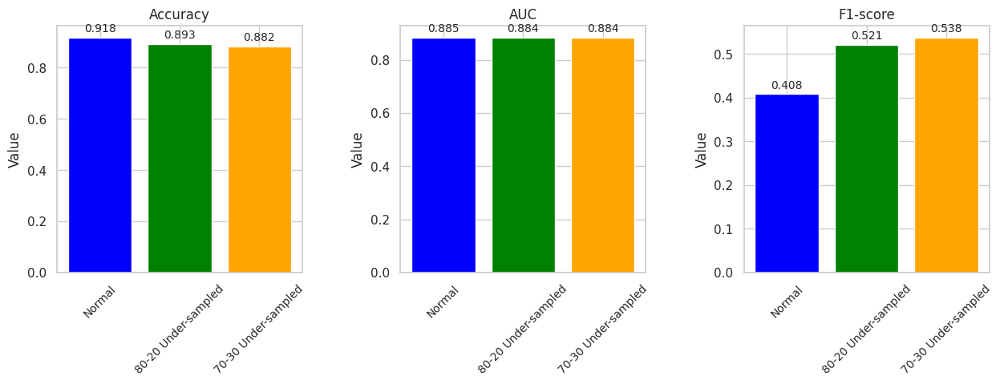

In [ ]:
# Retrieve the metric values for Random Forest models
accuracy_values_forest = [accuracy_normal_forest, accuracy_80_20_forest, accuracy_70_30_forest]
auc_values_forest = [auc_normal_forest, auc_80_20_forest, auc_70_30_forest]
f1_values_forest = [f1_normal_forest, f1_80_20_forest, f1_70_30_forest]

# Create lists for metrics for Random Forest
metrics_forest = ['Accuracy', 'AUC', 'F1-score']

# Create subplots for bar charts
fig, axes = plt.subplots(1, 3, figsize=(15, 4))  # Define the layout and size of the figure
fig.subplots_adjust(hspace=0.3, wspace=0.4)  # Adjust spacing

# Plot bar charts for each metric for Random Forest
for i, metric in enumerate(metrics_forest):
    ax = axes[i]

    if metric == 'Accuracy':
        bars = ax.bar(summary_table_forest['Model'], accuracy_values_forest, color=['blue', 'green', 'orange'])
    elif metric == 'AUC':
        bars = ax.bar(summary_table_forest['Model'], auc_values_forest, color=['blue', 'green', 'orange'])
    elif metric == 'F1-score':
        bars = ax.bar(summary_table_forest['Model'], f1_values_forest, color=['blue', 'green', 'orange'])

    ax.set_title(metric)
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=45, labelrotation=45, labelsize='small')

    # Display data labels on the bars for clarity
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(round(height, 3)),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize='small')

plt.show()

### Assess model on test set

In [ ]:
# Fit the 70-30 under-sampled Random Forest Model on the test set
best_forest_model_70_30 = RandomForestClassifier(max_depth=best_params_70_30_tree['max_depth'],
                                               min_samples_split=best_params_70_30_tree['min_samples_split'])
best_forest_model_70_30.fit(X_train_70_30, y_train_70_30)

# Predictions for the 70-30 under-sampled Random Forest Model on test set
y_pred_70_30_test_forest = best_forest_model_70_30.predict(X_test)

# Calculate performance metrics for the 70-30 under-sampled Random Forest Model on test set
accuracy_70_30_test_forest = accuracy_score(y_test, y_pred_70_30_test_forest)
auc_70_30_test_forest = roc_auc_score(y_test, best_forest_model_80_20.predict_proba(X_test)[:, 1])
f1_70_30_test_forest = f1_score(y_test, y_pred_70_30_test_forest)

# Print out performance metrics on test set for Random Forest Model
print("\nPerformance Metrics for 70-30 Under-sampled Random Forest Model on Test Set:")
print(f"Accuracy: {accuracy_70_30_test_forest:.4f}")
print(f"AUC: {auc_70_30_test_forest:.4f}")
print(f"F1-score: {f1_70_30_test_forest:.4f}")


Performance Metrics for 70-30 Under-sampled Random Forest Model on Test Set:
Accuracy: 0.8881
AUC: 0.8921
F1-score: 0.4987


### Result for Interpretation

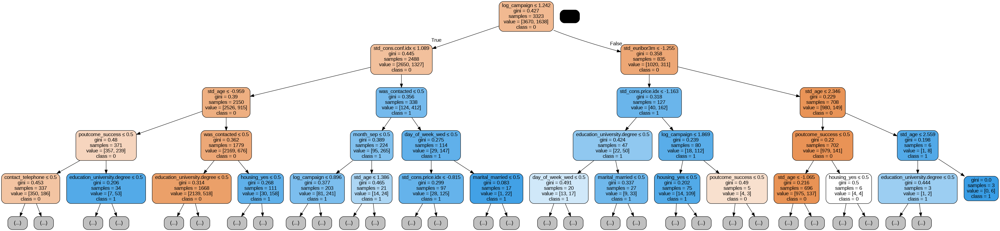

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
import matplotlib.pyplot as plt
import pandas as pd

# Fit the 70-30 under-sampled Random Forest Model on the training set
best_forest_model_70_30 = RandomForestClassifier(max_depth=best_params_70_30_tree['max_depth'],
                                               min_samples_split=best_params_70_30_tree['min_samples_split'])
best_forest_model_70_30.fit(X_train_70_30, y_train_70_30)

# Visualize one of the trees in the Random Forest
tree_idx = 0  # Index of the tree to visualize
tree = best_forest_model_70_30.estimators_[tree_idx]

# Export the decision tree to a DOT file
dot_data = export_graphviz(
    tree,
    out_file=None,
    feature_names=X_train.columns,
    class_names=['0', '1'],
    filled=True,
    rounded=True,
    special_characters=True,
    max_depth=4  # Limiting the depth for better visualization
)

# Convert DOT file to PNG image
graph = pydotplus.graph_from_dot_data(dot_data)

# Display the image in Jupyter Notebook
Image(graph.create_png())

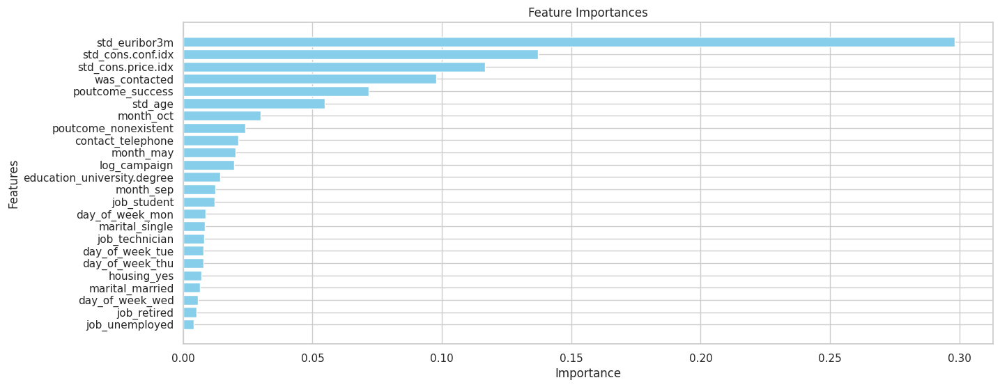

In [ ]:
# Extract feature importances
feature_importances = best_forest_model_80_20.feature_importances_
features = X_test.columns

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(15, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()


##Model Comparison

### Accuracy Comparison

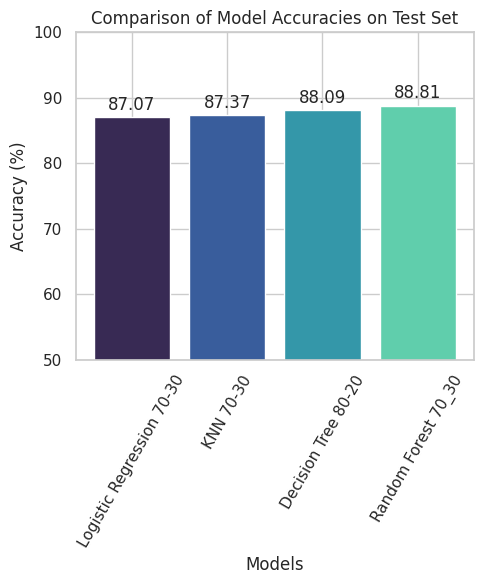

In [ ]:
# List of model names and their corresponding accuracy variables
models = ['Logistic Regression 70-30', 'KNN 70-30', 'Decision Tree 80-20', 'Random Forest 70_30']
accuracies = [
    accuracy_70_30_test_lr,
    accuracy_70_30_test_knn,
    accuracy_80_20_test_tree,
    accuracy_70_30_test_forest
]

# Convert accuracy to percentage for better readability
accuracies = [x * 100 for x in accuracies]  # Convert to percentage

# Set the color palette
palette = sns.color_palette("mako", len(models))

# Create the bar chart
plt.figure(figsize=(5, 6))
bars = plt.bar(models, accuracies, color=palette)
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Comparison of Model Accuracies on Test Set')
plt.ylim([50, 100])  # Adjusting the limits to better visualize differences
plt.xticks(rotation=60)

# Adding data labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()

### ROC-AUC Comparison

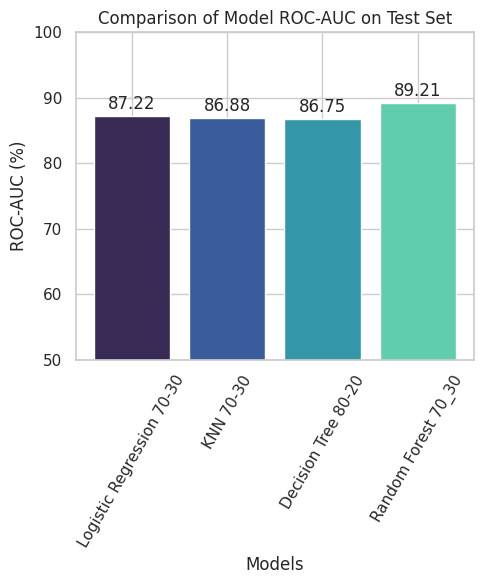

In [ ]:
# List of model names and their corresponding accuracy variables
models = ['Logistic Regression 70-30', 'KNN 70-30', 'Decision Tree 80-20', 'Random Forest 70_30']
aucs = [
    auc_70_30_test_lr,
    auc_70_30_test_knn,
    auc_80_20_test_tree,
    auc_70_30_test_forest
]

# Convert accuracy to percentage for better readability
aucs = [x * 100 for x in aucs]  # Convert to percentage

# Create the bar chart
plt.figure(figsize=(5, 6))
bars = plt.bar(models, aucs, color=palette)
plt.xlabel('Models')
plt.ylabel('ROC-AUC (%)')
plt.title('Comparison of Model ROC-AUC on Test Set')
plt.ylim([50, 100])  # Adjusting the limits to better visualize differences
plt.xticks(rotation=60)

# Adding data labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()

### F1-Score Comparison

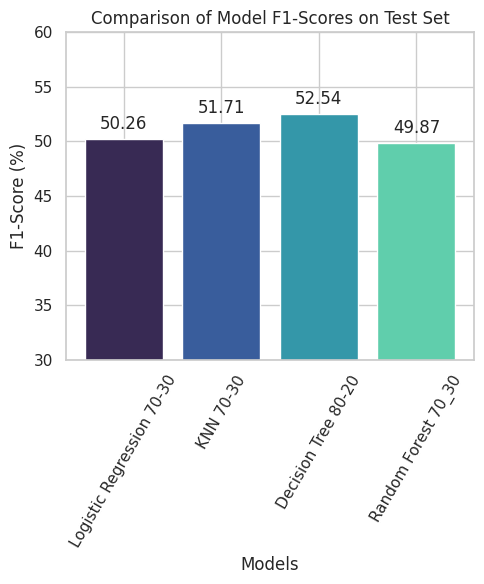

In [ ]:
# List of model names and their corresponding accuracy variables
models = ['Logistic Regression 70-30', 'KNN 70-30', 'Decision Tree 80-20', 'Random Forest 70_30']
f1_scores = [
    f1_70_30_test_lr,
    f1_70_30_test_knn,
    f1_80_20_test_tree,
    f1_70_30_test_forest
]

# Convert accuracy to percentage for better readability
f1_scores = [x * 100 for x in f1_scores]  # Convert to percentage

# Create the bar chart
plt.figure(figsize=(5, 6))
bars = plt.bar(models, f1_scores, color=palette)
plt.xlabel('Models')
plt.ylabel('F1-Score (%)')
plt.title('Comparison of Model F1-Scores on Test Set')
plt.ylim([30, 60])  # Adjusting the limits to better visualize differences
plt.xticks(rotation=60)

# Adding data labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()